# Imports and Data

In [1]:
# Imports
import pickle
import numpy as np
from matplotlib.pyplot import cm
from matplotlib import pyplot as plt
from matplotlib import patches
from copy import deepcopy
import plotly.graph_objects as go
from scipy.optimize import curve_fit
from dataclasses import make_dataclass
import os

import sys
module_path = 'code' 
if module_path not in sys.path:
    sys.path.append(module_path)
    
np.set_printoptions(threshold=sys.maxsize)

# Markus's code
from MM_Plot_Utils import plot, hist
from MM_Maze_Utils import *
from MM_Traj_Utils import *
from DORA_Utils_Utils import *
from DORA_Calc_Utils import *
from DORA_Plot_Utils import *

%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
UnrewNames=['B5','B6','B7','D3','D4','D5','D6','D7','D8','D9']
RewNames=['B1','B2','B3','B4','C1','C3','C6','C7','C8','C9']
UnrewNamesSub=['B5','B6','B7','D3','D4','D5','D7','D8','D9'] # excluding D6 which barely entered the maze
AllNames=RewNames+UnrewNames

# Calculations

In [3]:
ma=NewMaze(6)

## Calculate and Plot Cross Entropies

### Averages of steps to get to 80% of the nodes

In [115]:
avg,sd = GetAvgAndSD(NewNodesBiggerThanPercent(UnrewNamesSub,0.8))
print('Average steps of mice to get to 80% of the nodes: ' + str(avg) + ' +- ' + str(sd) + ' (SD)')

Average steps of mice to get to 80% of the nodes: 687.56 +- 167.36 (SD)


### Get CEs for mode 1 (DORA) at 80%

#### Initialize parameters

In [90]:
betas1 = np.linspace(0.2,2,10,endpoint=True)
betas2 = np.linspace(3,10,8,endpoint=True)
betas3 = np.linspace(50,500,10,endpoint=True)
betas = np.concatenate((betas1,betas2,betas3))
print(betas)
gammas = np.linspace(0,1,11,endpoint=True)
print(gammas)
etas = np.linspace(0.1,1,10, endpoint=True)
print(etas)
deltas = [1]
params = [betas,gammas,etas,deltas]
param_names = ['beta','gamma','eta']
mode = 1
maxpercent = 0.8

[2.0e-01 4.0e-01 6.0e-01 8.0e-01 1.0e+00 1.2e+00 1.4e+00 1.6e+00 1.8e+00
 2.0e+00 3.0e+00 4.0e+00 5.0e+00 6.0e+00 7.0e+00 8.0e+00 9.0e+00 1.0e+01
 5.0e+01 1.0e+02 1.5e+02 2.0e+02 2.5e+02 3.0e+02 3.5e+02 4.0e+02 4.5e+02
 5.0e+02]
[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]
[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]


#### Calculate CEs at maxpercent

In [91]:
# Find minimum parameters at maxpercent
frame = -1
subdir = 'outdata_DORA/'+str(mode)+'mode_'+str(maxpercent)+'percent/'
fstr_ces = subdir + '%s_ces_'+str(mode)+'mode_'+str(frame)+'frame_'+str(maxpercent)+'percent.npy'

In [99]:
os.makedirs(subdir, exist_ok=True)    
OutCEs(names=UnrewNamesSub,params=params,ma=ma,mode=mode,frame=frame,maxpercent=maxpercent,fstr=fstr_ces)

[array([[[[list([1.5830782867021589])],
          [list([1.5813375726718693])],
          [list([1.5797691596684251])],
          [list([1.5784320611282443])],
          [list([1.577352273088741])],
          [list([1.5765240714648225])],
          [list([1.5759233768313117])],
          [list([1.5755197934499368])],
          [list([1.575285073398768])],
          [list([1.5751986260044089])]],
 
         [[list([1.5832334348627861])],
          [list([1.5815987795497626])],
          [list([1.5800973471239177])],
          [list([1.5787867031740253])],
          [list([1.5776970644204094])],
          [list([1.5768311569596791])],
          [list([1.576173994576878])],
          [list([1.5757023893969415])],
          [list([1.5753920911318835])],
          [list([1.5752227643264884])]],
 
         [[list([1.583394015752428])],
          [list([1.581872609606482])],
          [list([1.5804450003282164])],
          [list([1.579167397798777])],
          [list([1.5780737197618016])],


#### Get minimum parameters

In [100]:
# Minimum parameters
np.save(subdir + 'ces_argmin_' + str(mode) + 'mode_'+ str(frame) + 'frame_' + str(maxpercent)+'percent.npy',
        list(GetMinArgList(Names=UnrewNamesSub,fstr_load=fstr,parameters=params,frame=frame,percent=-1,avg=False)))

In [92]:
mins,argmins = np.load(subdir + 'ces_argmin_' + str(mode) + 'mode_'+ str(frame) + 'frame_'+str(maxpercent)+'percent.npy', allow_pickle=True)
print(mins)
avg,sd = GetAvgAndSD(mins)
print('Average cross-entropy loss with minimum parameters at 80%: ' + str(avg) + ' +- ' + str(sd))
print(argmins)

[1.560177854104032 1.545206689861709 1.566015375049043 1.5501180858471004
 1.5553412913373021 1.548879542227888 1.44819823446787 1.5705380880960433
 1.5646402803784445]
Average cross-entropy loss with minimum parameters at 80%: 1.55 +- 0.04
[list([1.4, 0.7, 0.9, 1]) list([1.4, 0.4, 0.9, 1])
 list([0.6, 0.0, 1.0, 1]) list([1.2, 0.4, 0.9, 1])
 list([1.2, 0.5, 0.9, 1]) list([1.0, 0.3, 1.0, 1])
 list([2.0, 0.0, 0.6, 1]) list([0.8, 0.3, 1.0, 1])
 list([0.6, 0.0, 1.0, 1])]


In [93]:
# get average of parameters
clean_argmin = [list(item) for item in argmins]
print(np.mean(clean_argmin,axis=0))

[1.13333333 0.28888889 0.91111111 1.        ]


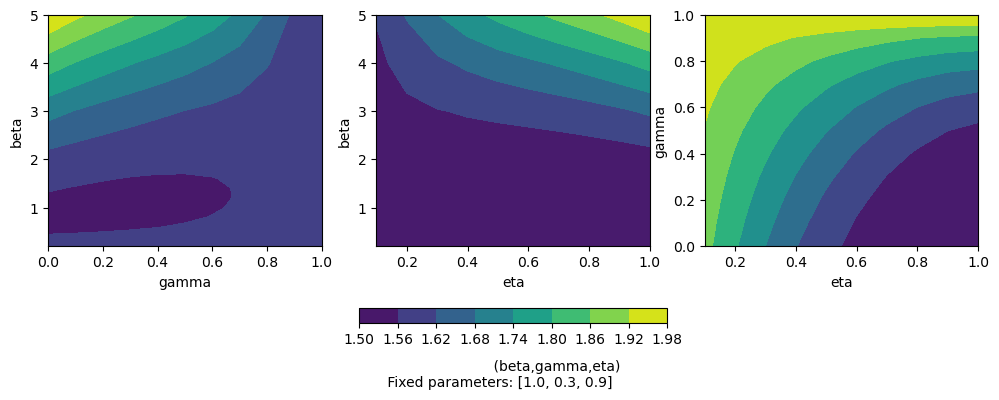

In [101]:
# fixed params by index of closest to average parameter in params list
fixed_params = [4,3,8]
fig,_ = PlotTopology1(UnrewNamesSub, fstr_ces, params, fixed_params,'gamma')

In [102]:
url = subdir+'topology_'+str(mode)+'mode_'+str(maxpercent)+'percent.pdf'
fig.savefig(url,bbox_inches="tight")

#### Calculate CE with mimimum parameter at every step, plot and get average

In [333]:
frame=1
url_ces = subdir+'ces_'+str(mode)+'mode_'+str(frame)+'frame_'+str(maxpercent)+'percent'

In [ ]:
OutCEsNamesParams(UnrewNamesSub,argmins,ma,mode,frame=1,url=url_ces+'.npy')

In [106]:
savg,sstd,pavg,pstd = GetAvgStepsForRandCE(UnrewNamesSub,argmins,ma,mode,maxpercent,frame=1)
print('Steps until cross-entropy loss >= log_2(3) for minimum parameters in E_32: ')
print(str(savg) + ' +- ' + str(sstd))
print('and in percentage out of total nodes: ')
print(str(round(pavg*100,2)) + '% +- ' + str(round(pstd*100,2)) + '%')

Steps until cross-entropy loss >= log_2(3) for minimum parameters in E_32: 
796.5555555555555 +- 310.15842228380683
and in percentage out of total nodes: 
84.39% +- 6.58%


#### Simulate for efficiency

In [334]:
nbouts = 100
fstr_sim = subdir + '%s_sim_'+str(mode)+'mode_'+str(nbouts)+'bouts_'+str(maxpercent)+'percent.npy'

In [170]:
RunSim(UnrewNamesSub, argmins, nbouts, ma, mode, fstr=fstr_sim)

[array([  0,   1,   3,   8,  18,  37,  76,  37,  18,   8,  17,  36,  74,
         36,  74,  36,  17,  35,  17,  36,  73,  36,  73,  36,  17,   8,
         18,  38,  18,   8,  18,  37,  18,   8,  18,  38,  18,   8,   3,
          8,  17,  35,  71,  35,  72,  35,  71,  35,  72,  35,  72,  35,
         71,  35,  72,  35,  72,  35,  71,  35,  72,  35,  71,  35,  72,
         35,  71,  35,  72,  35,  71,  35,  71,  35,  71,  35,  72,  35,
         17,  36,  17,  36,  17,  35,  71,  35,  17,  36,  74,  36,  74,
         36,  17,   8,  17,   8,  18,  38,  77,  38,  78,  38,  77,  38,
         78,  38,  78,  38,  18,  37,  18,   8,   3,   8,  17,   8,   3,
          1,   4,  10,  22,  10,  21,  10,   4,   1,   4,   9,  19,   9,
          4,  10,  21,  44,  89,  44,  21,  43,  87,  43,  21,  44,  90,
         44,  89,  44,  89,  44,  90,  44,  89,  44,  89,  44,  90,  44,
         21,  43,  88,  43,  88,  43,  88,  43,  87,  43,  88,  43,  88,
         43,  87,  43,  21,  10,  22,  46,  93,  46

In [337]:
eff = GetEfficiency(UnrewNamesSub,fstr_sim)
avg,sd = GetAvgAndSD(eff)
print('Average efficiency of mice with minimum parameters for 80% of the nodes: ' + str(avg) + ' +- ' + str(sd) + ' (SD)')
avgexp,sdexp = GetAvgAndSD(ExplainedEfficiency(eff))
print('Which explains, on average: ' + str(avgexp) + ' +- ' + str(sdexp) + ' (SD)')

Average efficiency of mice with minimum parameters for 80% of the nodes: 0.21 +- 0.06 (SD)
Which explains, on average: 0.55 +- 0.15 (SD)


#### Plot

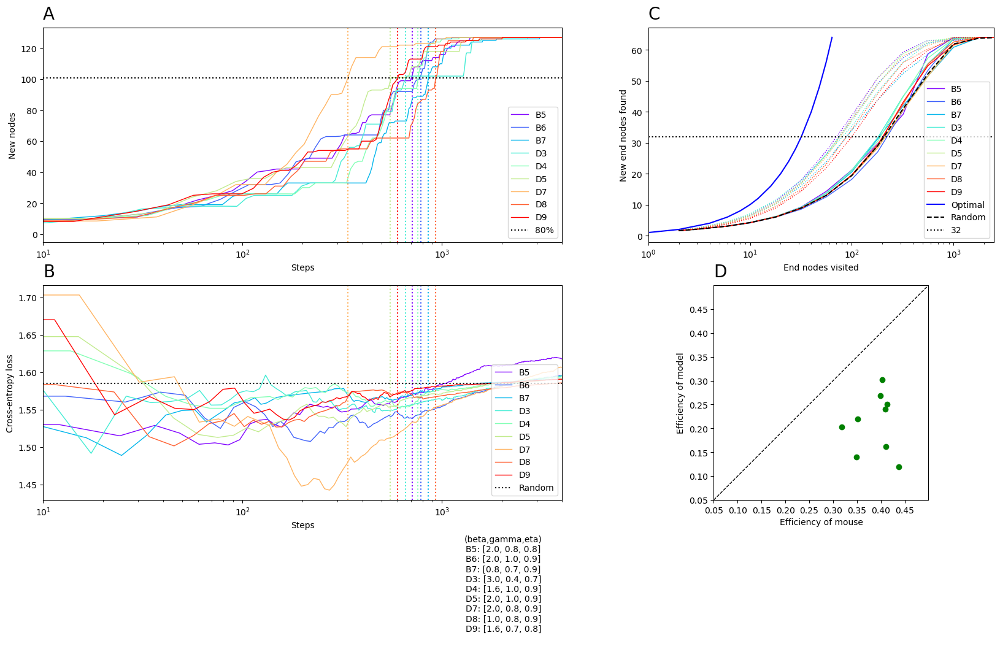

In [298]:
fig,_ = PlotMinAtPercent(UnrewNamesSub,argmins,param_names,url_ces+'.npy',fstr_sim,eff,maxpercent)

In [299]:
url = subdir+str(mode)+'mode_'+str(frame)+'frame_'+str(nbouts)+'bouts_'+str(maxpercent)+'percent.pdf'
fig.savefig(url,bbox_inches="tight")

### Get CEs for mode 4 (ADORA) at 80%

#### Initialize parameters

In [4]:
betas1 = np.linspace(0.2,2,10,endpoint=True)
betas2 = np.linspace(3,10,8,endpoint=True)
betas3 = np.linspace(50,500,10,endpoint=True)
betas = np.concatenate((betas1,betas2,betas3))
print(betas)
gammas = np.linspace(0,1,11,endpoint=True)
print(gammas)
etas = np.linspace(0.1,1,10, endpoint=True)
print(etas)
deltas = np.linspace(0,1,10, endpoint=False)
print(deltas)
params = [betas,gammas,etas,deltas]
param_names = ['beta','gamma','eta','delta']
mode = 4
maxpercent = 0.8

[2.0e-01 4.0e-01 6.0e-01 8.0e-01 1.0e+00 1.2e+00 1.4e+00 1.6e+00 1.8e+00
 2.0e+00 3.0e+00 4.0e+00 5.0e+00 6.0e+00 7.0e+00 8.0e+00 9.0e+00 1.0e+01
 5.0e+01 1.0e+02 1.5e+02 2.0e+02 2.5e+02 3.0e+02 3.5e+02 4.0e+02 4.5e+02
 5.0e+02]
[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]
[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]
[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9]


#### Calculate CEs at maxpercent

In [5]:
# Find minimum parameters at maxpercent
frame = -1
subdir = 'outdata_DORA/'+str(mode)+'mode_'+str(maxpercent)+'percent/'
fstr_ces = subdir + '%s_ces_'+str(mode)+'mode_'+str(frame)+'frame_'+str(maxpercent)+'percent.npy'

In [243]:
os.makedirs(subdir, exist_ok=True)    
OutCEs(names=UnrewNamesSub,params=params,ma=ma,mode=mode,frame=frame,maxpercent=maxpercent,fstr=fstr_ces)

[array([[[[list([3.0018136531684676]), list([1.4249470001488644]),
           list([1.3855927077542753]), list([1.387167947328707]),
           list([1.404025833469196]), list([1.4282675784983525]),
           list([1.4564692622284134]), list([1.486871942342859]),
           list([1.518475550671238]), list([1.5506728086590005])],
          [list([3.0027799058395654]), list([1.4268136335449813]),
           list([1.386918370291943]), list([1.3879979458023437]),
           list([1.4044000134118892]), list([1.4282211677397239]),
           list([1.456033557686578]), list([1.4860748737464577]),
           list([1.51734214675258]), list([1.54922558538386])],
          [list([3.0031630772442517]), list([1.4276181714897838]),
           list([1.3873681459492582]), list([1.3881223336344928]),
           list([1.4042248853194024]), list([1.4277694285056057]),
           list([1.4553255818930615]), list([1.4851288651426446]),
           list([1.5161744360201925]), list([1.5478508785500735])],
  

#### Get minimum parameters

In [244]:
# Minimum parameters
np.save(subdir + 'ces_argmin_' + str(mode) + 'mode_'+ str(frame) + 'frame_' + str(maxpercent)+'percent.npy',
        list(GetMinArgList(Names=UnrewNamesSub,fstr_load=fstr_ces,parameters=params,frame=frame,percent=-1,avg=False)))

C:\Users\shapi\anaconda3\lib\site-packages\numpy\lib\npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [6]:
mins,argmins = np.load(subdir + 'ces_argmin_' + str(mode) + 'mode_'+ str(frame) + 'frame_'+str(maxpercent)+'percent.npy', allow_pickle=True)
print(mins)
avg,sd = GetAvgAndSD(mins)
print('Average cross-entropy loss with minimum parameters at 80%: ' + str(avg) + ' +- ' + str(sd))
print(argmins)

[1.3827776182802898 1.3480513474995477 1.517248716556654
 1.3074007014246198 1.3990626094970322 1.3470837318395303
 1.3008609887122524 1.513393803775601 1.4539509685327414]
Average cross-entropy loss with minimum parameters at 80%: 1.4 +- 0.08
[list([0.2, 1.0, 0.1, 0.2]) list([0.2, 0.0, 1.0, 0.2])
 list([0.4, 0.0, 1.0, 0.5]) list([0.2, 1.0, 0.1, 0.2])
 list([0.4, 0.9, 1.0, 0.3]) list([0.2, 1.0, 0.1, 0.2])
 list([0.6, 0.0, 1.0, 0.2]) list([0.2, 0.1, 1.0, 0.5])
 list([0.2, 1.0, 0.1, 0.3])]


In [7]:
# get average of parameters
clean_argmin = [list(item) for item in argmins]
print(np.mean(clean_argmin,axis=0))

[0.28888889 0.55555556 0.6        0.28888889]


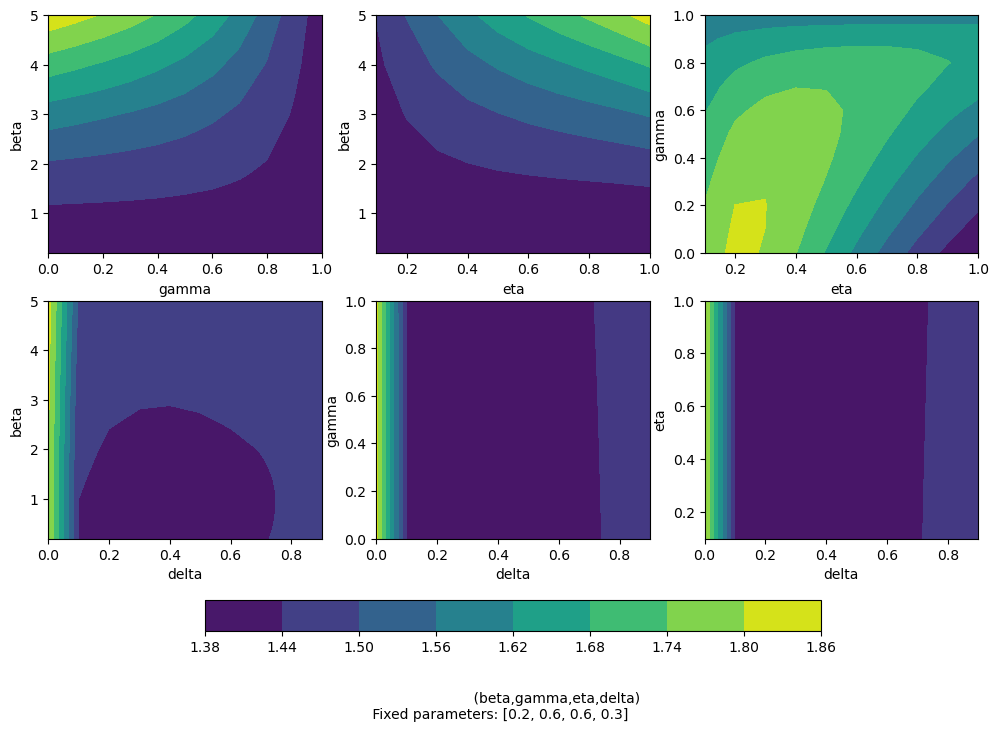

In [8]:
# fixed params by index of closest to average parameter in params list
fixed_params = [0,6,5,3]
fig,_ = PlotTopology4(UnrewNamesSub, fstr_ces, params, fixed_params)

In [9]:
url = subdir+'topology_'+str(mode)+'mode_'+str(maxpercent)+'percent.pdf'
fig.savefig(url,bbox_inches="tight")

#### Calculate CE with mimimum parameter at every step, plot and get average

In [341]:
frame=1
url_ces = subdir+'ces_'+str(mode)+'mode_'+str(frame)+'frame_'+str(maxpercent)+'percent'

In [247]:
OutCEsNamesParams(UnrewNamesSub,argmins,ma,mode,frame=1,url=url_ces+'.npy')

[[1.1375035237499347,
  1.1375035237499347,
  1.1375035237499347,
  1.1375035237499347,
  1.1375035237499347,
  1.1375035237499347,
  1.1375035237499347,
  1.1375035237499347,
  1.1375035237499347,
  1.1375035237499347,
  1.1375035237499347,
  1.330997531657215,
  1.3161133772028086,
  1.3033555305276034,
  1.292298730075759,
  1.2826240296803948,
  1.2740875293315441,
  1.2664995290214547,
  1.2597102655861117,
  1.2535999284943027,
  1.2480715282683805,
  1.2430457098811785,
  1.23845691917982,
  1.2342505277035747,
  1.230380647545429,
  1.2268084504763717,
  1.2235008605976148,
  1.220429527138769,
  1.2175700097805333,
  1.2149011269128467,
  1.2124044300366237,
  1.2100637767151647,
  1.2078649811707638,
  1.2057955265407394,
  1.2038443264610021,
  1.2020015263856947,
  1.2002583371252689,
  1.2597102655861117,
  1.256576759385184,
  1.2535999284943027,
  1.2507683088663915,
  1.2480715282683807,
  1.2455001793260914,
  1.2430457098811787,
  1.2407003279671511,
  1.2384569191798

In [248]:
savg,sstd,pavg,pstd = GetAvgStepsForRandCE(UnrewNamesSub,argmins,ma,mode,maxpercent,frame=1)
print('Steps until cross-entropy loss >= log_2(3) for minimum parameters in E_32: ')
print(str(savg) + ' +- ' + str(sstd))
print('and in percentage out of total nodes: ')
print(str(round(pavg*100,2)) + '% +- ' + str(round(pstd*100,2)) + '%')

Steps until cross-entropy loss >= log_2(3) for minimum parameters in E_32: 
3657.4444444444443 +- 3909.923958087253
and in percentage out of total nodes: 
89.86% +- 9.8%


#### Simulate for efficiency

In [342]:
nbouts = 100
fstr_sim = subdir + '%s_sim_'+str(mode)+'mode_'+str(nbouts)+'bouts_'+str(maxpercent)+'percent.npy'

In [250]:
RunSim(UnrewNamesSub, argmins, nbouts, ma, mode, fstr=fstr_sim)

[array([  0,   2,   5,  11,  24,  49, 100,  49,  24,  11,  23,  48,  98,
         48,  23,  47,  95,  47,  23,  11,  24,  11,  23,  48,  97,  48,
         98,  48,  97,  48,  98,  48,  23,  11,   5,  12,  26,  53, 108,
         53, 107,  53,  26,  54, 109,  54,  26,  53, 108,  53,  26,  54,
        109,  54, 110,  54, 109,  54, 110,  54, 109,  54, 109,  54,  26,
         12,  25,  52, 105,  52,  25,  12,   5,  11,  24,  49,  24,  11,
          5,   2,   6,  13,  27,  55,  27,  13,  28,  58, 118,  58,  28,
         13,  27,  56, 113,  56, 114,  56,  27,  13,  28,  58, 118,  58,
         28,  57, 115,  57,  28,  13,   6,   2,   0,   1,   4,  10,  21,
         44,  89,  44,  90,  44,  21,  43,  87,  43,  21,  10,  22,  46,
         93,  46,  22,  46,  22,  10,  21,  44,  89,  44,  21,  43,  88,
         43,  87,  43,  21,  43,  87,  43,  88,  43,  88,  43,  21,  44,
         90,  44,  90,  44,  21,  43,  88,  43,  87,  43,  88,  43,  21,
         44,  89,  44,  89,  44,  21,  10,  21,  10

In [343]:
eff = GetEfficiency(UnrewNamesSub,fstr_sim)
avg,sd = GetAvgAndSD(eff)
print('Average efficiency of mice with minimum parameters for 80% of the nodes: ' + str(avg) + ' +- ' + str(sd) + ' (SD)')
avgexp,sdexp = GetAvgAndSD(ExplainedEfficiency(eff))
print('Which explains, on average: ' + str(avgexp) + ' +- ' + str(sdexp) + ' (SD)')

Average efficiency of mice with minimum parameters for 80% of the nodes: 0.34 +- 0.11 (SD)
Which explains, on average: 0.88 +- 0.26 (SD)


#### Plot

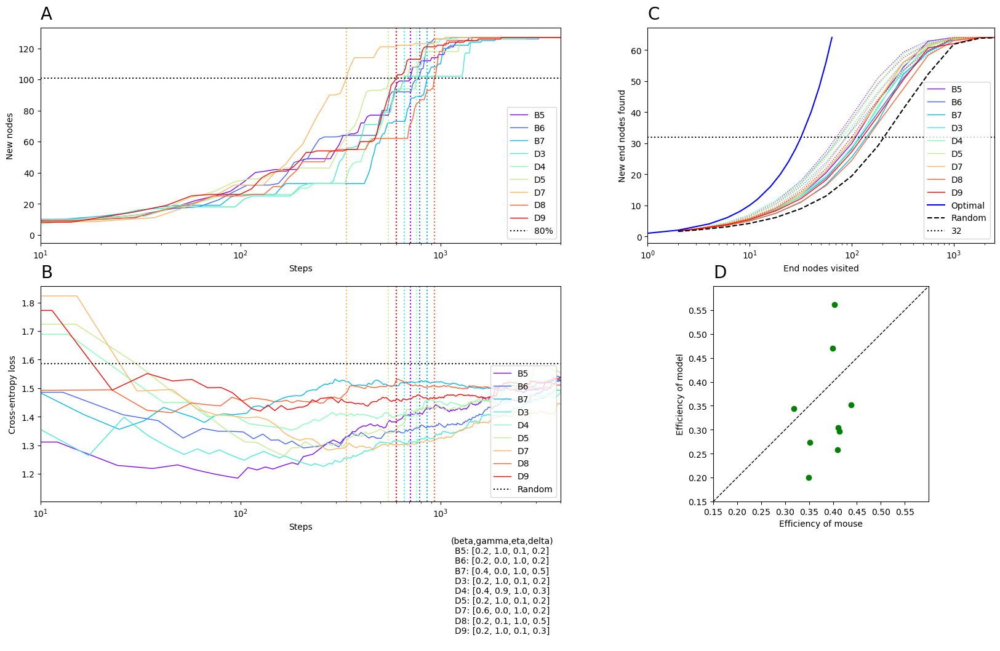

In [312]:
fig,_ = PlotMinAtPercent(UnrewNamesSub,argmins,param_names,url_ces+'.npy',fstr_sim,eff,maxpercent)

In [313]:
url = subdir+str(mode)+'mode_'+str(frame)+'frame_'+str(nbouts)+'bouts_'+str(maxpercent)+'percent.pdf'
fig.savefig(url,bbox_inches="tight")

### Get CEs for mode 3 (ODOR) at 80%

#### Initialize parameters

In [103]:
betas1 = np.linspace(0.2,2,10,endpoint=True)
betas2 = np.linspace(3,10,8,endpoint=True)
betas3 = np.linspace(50,500,10,endpoint=True)
betas = np.concatenate((betas1,betas2,betas3))
print(betas)
lambdas = np.linspace(0,1,11,endpoint=True)
print(lambdas)
etas = np.linspace(0.1,1,10, endpoint=True)
print(etas)
deltas = [1]
print(deltas)
params = [betas,lambdas,etas,deltas]
param_names = ['beta','lambda','eta']
mode = 3
maxpercent = 0.8

[2.0e-01 4.0e-01 6.0e-01 8.0e-01 1.0e+00 1.2e+00 1.4e+00 1.6e+00 1.8e+00
 2.0e+00 3.0e+00 4.0e+00 5.0e+00 6.0e+00 7.0e+00 8.0e+00 9.0e+00 1.0e+01
 5.0e+01 1.0e+02 1.5e+02 2.0e+02 2.5e+02 3.0e+02 3.5e+02 4.0e+02 4.5e+02
 5.0e+02]
[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]
[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]
[1]


#### Calculate CEs at maxpercent

In [104]:
# Find minimum parameters at maxpercent
frame = -1
subdir = 'outdata_DORA/'+str(mode)+'mode_'+str(maxpercent)+'percent/'
fstr_ces = subdir + '%s_ces_'+str(mode)+'mode_'+str(frame)+'frame_'+str(maxpercent)+'percent.npy'

In [257]:
os.makedirs(subdir, exist_ok=True)    
OutCEs(names=UnrewNamesSub,params=params,ma=ma,mode=mode,frame=frame,maxpercent=maxpercent,fstr=fstr_ces)

[array([[[[list([1.5858266377762003])],
          [list([1.5846177866428772])],
          [list([1.5827202610987798])],
          [list([1.5808074194077475])],
          [list([1.5791032678195536])],
          [list([1.577663413781856])],
          [list([1.5764810435493402])],
          [list([1.5755264147281296])],
          [list([1.5747638003914974])],
          [list([1.5741600912539906])]],
 
         [[list([1.5843078319848354])],
          [list([1.5764707881618838])],
          [list([1.5678424407190414])],
          [list([1.562951603024039])],
          [list([1.5598959006158977])],
          [list([1.557387896108581])],
          [list([1.5562625795912715])],
          [list([1.5570603716189015])],
          [list([1.5577155154329692])],
          [list([1.5741600912539906])]],
 
         [[list([1.5849625007211563])],
          [list([1.5823514980508653])],
          [list([1.5746408325433743])],
          [list([1.5646854608808463])],
          [list([1.5571783495067335])

#### Get minimum parameters

In [258]:
# Minimum parameters
np.save(subdir + 'ces_argmin_' + str(mode) + 'mode_'+ str(frame) + 'frame_' + str(maxpercent)+'percent.npy',
        list(GetMinArgList(Names=UnrewNamesSub,fstr_load=fstr_ces,parameters=params,frame=frame,percent=-1,avg=False)))

C:\Users\shapi\anaconda3\lib\site-packages\numpy\lib\npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [105]:
mins,argmins = np.load(subdir + 'ces_argmin_' + str(mode) + 'mode_'+ str(frame) + 'frame_'+str(maxpercent)+'percent.npy', allow_pickle=True)
print(mins)
avg,sd = GetAvgAndSD(mins)
print('Average cross-entropy loss with minimum parameters at 80%: ' + str(avg) + ' +- ' + str(sd))
print(argmins)

[1.3781660839398047 1.3457871926797993 1.5151011810890618
 1.2900667588975543 1.3870527253116083 1.3329771375291317
 1.2707419382370313 1.4932208152943158 1.443122224914852]
Average cross-entropy loss with minimum parameters at 80%: 1.38 +- 0.08
[list([2.0, 0.8, 0.8, 1]) list([2.0, 1.0, 0.9, 1])
 list([0.8, 0.7, 0.9, 1]) list([3.0, 0.4, 0.7, 1])
 list([1.6, 1.0, 0.9, 1]) list([2.0, 1.0, 0.9, 1])
 list([2.0, 0.8, 0.9, 1]) list([1.0, 0.8, 0.9, 1])
 list([1.6, 0.7, 0.8, 1])]


In [106]:
# get average of parameters
clean_argmin = [list(item) for item in argmins]
print(np.mean(clean_argmin,axis=0))

[1.77777778 0.8        0.85555556 1.        ]


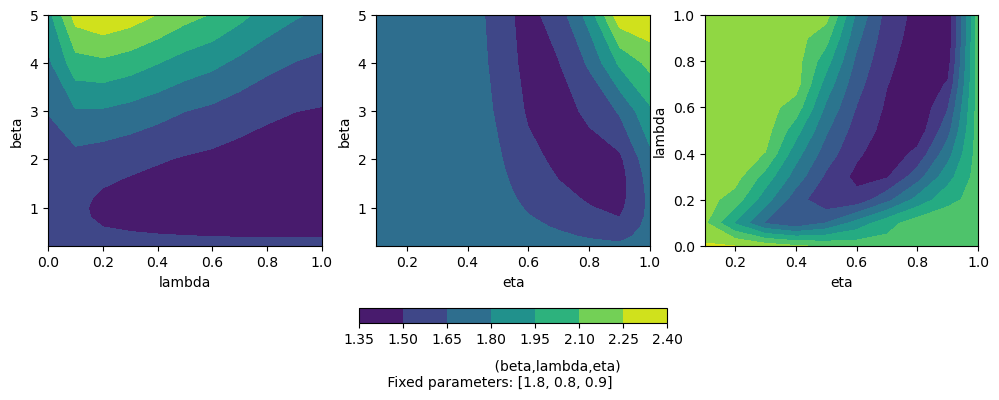

In [107]:
# fixed params by index of closest to average parameter in params list
fixed_params = [8,8,8]
fig,_ = PlotTopology1(UnrewNamesSub, fstr_ces, params, fixed_params, 'lambda')

In [108]:
url = subdir+'topology_'+str(mode)+'mode_'+str(maxpercent)+'percent.pdf'
fig.savefig(url,bbox_inches="tight")

#### Calculate CE with mimimum parameter at every step, plot and get average

In [347]:
frame=1
url_ces = subdir+'ces_'+str(mode)+'mode_'+str(frame)+'frame_'+str(maxpercent)+'percent'

In [261]:
OutCEsNamesParams(UnrewNamesSub,argmins,ma,mode,frame=1,url=url_ces+'.npy')

[[1.584962500721156,
  1.3863769352835633,
  1.3201817468043657,
  1.287084152564767,
  1.2672255960210077,
  1.2539865583251681,
  1.24453010282814,
  1.2324416526635082,
  1.2274805101282265,
  1.223511596100001,
  1.22026430280418,
  1.416542572223504,
  1.398946325886771,
  1.3838638290267138,
  1.3653920194304896,
  1.3542919788314571,
  1.3444978253617226,
  1.335791911166403,
  1.3247704798072102,
  1.3179215243091482,
  1.3117248502870922,
  1.3060915102670412,
  1.2982781713572455,
  1.2936745546276092,
  1.2894392272363435,
  1.2855296942597907,
  1.281909756318538,
  1.278548385373089,
  1.2754188331135332,
  1.2711656220601182,
  1.2684761300532101,
  1.2659547312967339,
  1.2623749667577748,
  1.2601813315544863,
  1.2581130469342428,
  1.256159667015124,
  1.2526522358888164,
  1.2995414144755275,
  1.2844852222320824,
  1.2810686542140575,
  1.2787935984977625,
  1.276626878767958,
  1.2745609367000048,
  1.2725889010896858,
  1.270704511506492,
  1.267300426980802,
  1.

In [262]:
savg,sstd,pavg,pstd = GetAvgStepsForRandCE(UnrewNamesSub,argmins,ma,mode,maxpercent,frame=1)
print('Steps until cross-entropy loss >= log_2(3) for minimum parameters in E_32: ')
print(str(savg) + ' +- ' + str(sstd))
print('and in percentage out of total nodes: ')
print(str(round(pavg*100,2)) + '% +- ' + str(round(pstd*100,2)) + '%')

Steps until cross-entropy loss >= log_2(3) for minimum parameters in E_32: 
3489.777777777778 +- 3783.6353705509136
and in percentage out of total nodes: 
89.86% +- 9.8%


#### Simulate for efficiency

In [348]:
nbouts = 100
fstr_sim = subdir + '%s_sim_'+str(mode)+'mode_'+str(nbouts)+'bouts_'+str(maxpercent)+'percent.npy'

In [264]:
RunSim(UnrewNamesSub, argmins, nbouts, ma, mode, fstr=fstr_sim)

[array([  0,   1,   3,   8,  18,  38,  77,  -1,   0, 127,   0,   1,   3,
          7,  15,  31,  63,  -1,   0,   2,   5,   2,   0, 127,   0,   1,
          3,   8,   3,   8,   3,   7,  15,  32,  15,  32,  66,  -1,   0,
          2,   6,  14,  29,  60, 121,  60,  29,  14,  30,  14,   6,  14,
         30,  14,   6,   2,   5,  11,  23,  47,  23,  48,  23,  11,  24,
         50, 102,  -1,  -1,  -1,   0,   1,   3,   8,  18,  38,  77,  -1,
          0,   1,   4,  10,   4,   1,   4,   9,  19,  39,  79,  -1,   0,
        127,   0, 127,   0,   1,   0, 127,   0, 127,   0,   2,   6,  13,
         27,  13,  28,  57, 115,  -1,   0,   2,   6,  14,  30,  62,  30,
         62, 125,  -1,   0, 127,   0,   2,   5,   2,   0, 127,   0,   1,
          3,   8,  17,  36,  74,  -1,   0,   1,   0, 127,   0, 127,   0,
          1,   0,   2,   5,  12,  26,  12,   5,  11,  24,  49,  99,  -1,
          0,   1,   4,   1,   3,   8,  17,  35,  71,  -1,   0, 127,   0,
          2,   0,   1,   3,   7,   3,   8,   3,   1

In [349]:
eff = GetEfficiency(UnrewNamesSub,fstr_sim)
avg,sd = GetAvgAndSD(eff)
print('Average efficiency of mice with minimum parameters for 80% of the nodes: ' + str(avg) + ' +- ' + str(sd) + ' (SD)')
avgexp,sdexp = GetAvgAndSD(ExplainedEfficiency(eff))
print('Which explains, on average: ' + str(avgexp) + ' +- ' + str(sdexp) + ' (SD)')

Average efficiency of mice with minimum parameters for 80% of the nodes: 0.73 +- 0.07 (SD)
Which explains, on average: 1.89 +- 0.29 (SD)


#### Plot

H:\My Drive\Studies\Semester 6\Project\Rosenberg-2021-Repository-DORA\code\DORA_Utils_Utils.py:168: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  for nickname in names:


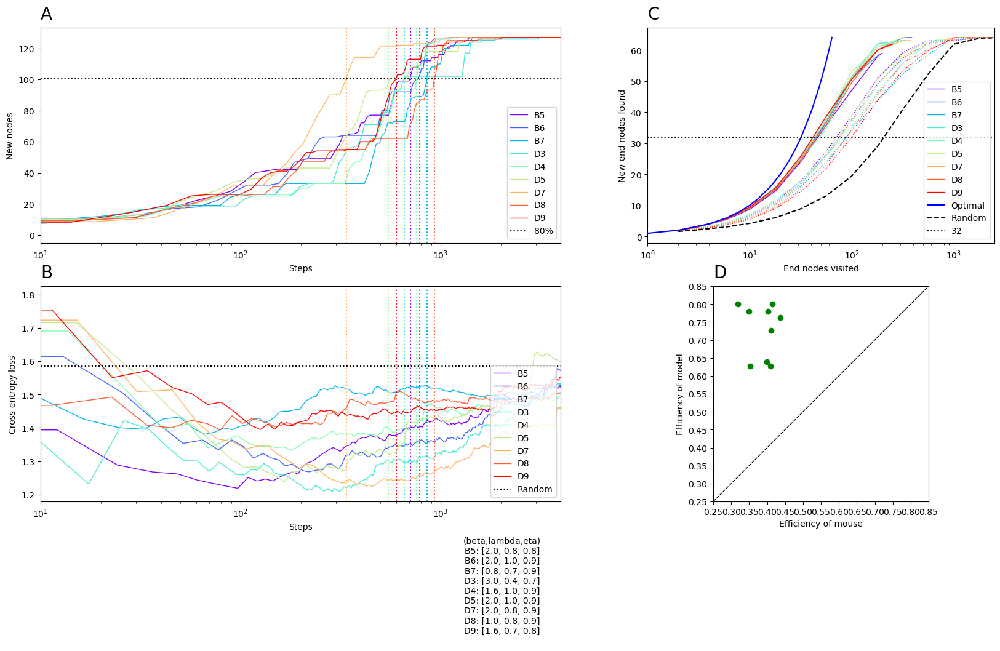

In [328]:
fig,_ = PlotMinAtPercent(UnrewNamesSub,argmins,param_names,url_ces+'.npy',fstr_sim,eff,maxpercent)

In [329]:
url = subdir+str(mode)+'mode_'+str(frame)+'frame_'+str(nbouts)+'bouts_'+str(maxpercent)+'percent.pdf'
fig.savefig(url,bbox_inches="tight")

## Plot Cross-entropy comparison

In [1]:
with open('outdata/BZentropies', 'rb') as f:
    _,en=pickle.load(f)  
with open('outdata/FixEntropies-TJ1-EX1-Split5-LevelsLR', 'rb') as f:
    _,ef=pickle.load(f)  
with open('outdata/VarEntropies-TJ1-EX1-Split5-LevelsLR', 'rb') as f:
    _,ev=pickle.load(f)  
with open('outdata/FourBiasEntropies-TJ1-EX1-Split5', 'rb') as f:
    _,eb=pickle.load(f)  
    
k=len(RewNames)
UN=np.array(UnrewNamesSub)
ev=np.array(ev);ef=np.array(ef);eb=np.array(eb);en=np.array(en)
evu=ev[k:];efu=ef[k:];ebu=eb[k:];enu=en[k:]
siu=np.argsort(evu)

min1,_ = np.load('outdata_DORA/1mode_0.8percent/ces_argmin_1mode_-1frame_0.8percent.npy', allow_pickle=True)
min3,_ = np.load('outdata_DORA/3mode_0.8percent/ces_argmin_3mode_-1frame_0.8percent.npy', allow_pickle=True)
min4,_ = np.load('outdata_DORA/4mode_0.8percent/ces_argmin_4mode_-1frame_0.8percent.npy', allow_pickle=True)

fig,ax = plt.subplots()

ax.axhline(y=-np.log2(1/3), linestyle=':', color='k', label='Random walk') # plot random policy line
ax.plot(np.arange(len(UN)),evu[siu],linestyle='',color='lightgray',marker='_',markersize=6,markeredgewidth=3, label='Markov variable')
ax.plot(np.arange(len(UN)),efu[siu],linestyle='',color='darkgray',marker='_',markersize=6,markeredgewidth=3, label='Markov fixed')
ax.plot(np.arange(len(UN)),ebu[siu],linestyle='',color='dimgray',marker='_',markersize=6,markeredgewidth=3, label='Biased walk')
ax.plot(np.arange(len(UN)),min1[siu],'b_',markersize=6,markeredgewidth=3,label='DORA')
ax.plot(np.arange(len(UN)),min4[siu],'r_',markersize=6,markeredgewidth=3,label='Adjusted DORA')
ax.plot(np.arange(len(UN)),min3[siu],'g_',markersize=6,markeredgewidth=3,label='ODOR')

ax.legend(ncol=2,bbox_to_anchor=(0.85, -0.1))
ax.set_xticks(list(np.arange(len(UN))),list(UN[siu]))
fig.set_figheight(3.5)
fig.set_figwidth(6)

NameError: name 'pickle' is not defined

In [63]:
fig.savefig('outdata_DORA/model_comparison.pdf',bbox_inches="tight")